In [1]:
import pathlib
import os
from PIL import Image

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor

import random

In [2]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
import cv2

In [3]:
from captum.attr import IntegratedGradients
from captum.attr import Saliency
from captum.attr import DeepLift

/home/davide/Desktop/SAM_tests/SAM_tests/env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


In [5]:
batch_size = 16

In [6]:
# load the images and masks
dir_images_train = pathlib.Path('../../data/kvasir-seg/Kvasir-SEG-processed/train/images')
dir_masks_train = pathlib.Path('../../data/kvasir-seg/Kvasir-SEG-processed/train/masks')
dir_images_test = pathlib.Path('../../data/kvasir-seg/Kvasir-SEG-processed/test/images')
dir_masks_test = pathlib.Path('../../data/kvasir-seg/Kvasir-SEG-processed/test/masks')

In [7]:
train_ids = [f.stem for f in dir_images_train.glob("*.jpg")]
test_ids = [f.stem for f in dir_images_test.glob("*.jpg")]

In [8]:
len(train_ids), len(test_ids)

(762, 182)

In [9]:
class KvasirSegDataset(Dataset):
    def __init__(self, image_dir, mask_dir, ids, transform=None):
        """
        Args:
            image_dir (pathlib.Path): Directory with all the images.
            mask_dir (pathlib.Path): Directory with all the masks.
            pca_data (pd.DataFrame): DataFrame containing PCA features.
            ids (list): List of image/mask IDs (without extensions).
            transform (callable, optional): Optional additional transform to be applied on an image/mask.
        """
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.ids = ids
        self.transform = transform
        self.to_tensor = ToTensor()  # Define ToTensor transformation

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        name = self.ids[idx]
        # Load image and mask
        image = np.array(Image.open(self.image_dir / f"{name}.jpg").convert("RGB"))
        
        mask = np.array(Image.open(self.mask_dir / f"{name}.jpg").convert("L")) / 255
        #mask = np.array(mask)

        # Apply ToTensor transformation
        #image = self.to_tensor(image)
        #mask = self.to_tensor(mask)


        ## Apply additional transformations if provided
        #if self.transform:
        #    image = self.transform(image)
        #    mask = self.transform(mask)

        return image, mask


In [10]:
# Create datasets with transformations
dataset_train = KvasirSegDataset(dir_images_train, dir_masks_train, train_ids)
dataset_test = KvasirSegDataset(dir_images_test, dir_masks_test, test_ids)

# Create dataloaders
train_loader = DataLoader(dataset_train, batch_size=batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(dataset_test, batch_size=1, shuffle=False, num_workers=4)

In [11]:
#for images, masks in train_loader:
#    print(images[0].shape)
#    print(images[0])
#    break

In [12]:
## plot the images and masks
#def plot_images_and_masks(images, masks):
#    num_images = len(images)
#    fig, axs = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))
#    for i in range(num_images):
#        axs[i, 0].imshow(images[i])
#        axs[i, 0].set_title("Image")
#        axs[i, 1].imshow(masks[i], cmap='gray')
#        axs[i, 1].set_title("Mask")
#    plt.show()
## Get a batch of images and masks
#for images, masks in train_loader:
#    plot_images_and_masks(images, masks)
#    break

In [13]:
class UNet(torch.nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(UNet, self).__init__()

        # Encoder
        self.enc1 = self.conv_block(in_channels, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)

        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024)

        # Decoder
        self.upconv4 = self.upconv(1024, 512)
        self.dec4 = self.conv_block(1024, 512)

        self.upconv3 = self.upconv(512, 256)
        self.dec3 = self.conv_block(512, 256)

        self.upconv2 = self.upconv(256, 128)
        self.dec2 = self.conv_block(256, 128)

        self.upconv1 = self.upconv(128, 64)
        self.dec1 = self.conv_block(128, 64)

        # Final Convolution
        self.final_conv = torch.nn.Conv2d(64, out_channels, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return torch.nn.Sequential(
            torch.nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            torch.nn.ReLU(inplace=True),
            torch.nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            torch.nn.ReLU(inplace=True)
        )

    def upconv(self, in_channels, out_channels):
        return torch.nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)

    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(torch.nn.functional.max_pool2d(enc1, kernel_size=2))
        enc3 = self.enc3(torch.nn.functional.max_pool2d(enc2, kernel_size=2))
        enc4 = self.enc4(torch.nn.functional.max_pool2d(enc3, kernel_size=2))

        # Bottleneck
        bottleneck = self.bottleneck(torch.nn.functional.max_pool2d(enc4, kernel_size=2))

        # Decoder
        up4 = self.upconv4(bottleneck)
        dec4 = self.dec4(torch.cat([up4, enc4], dim=1))

        up3 = self.upconv3(dec4)
        dec3 = self.dec3(torch.cat([up3, enc3], dim=1))

        up2 = self.upconv2(dec3)
        dec2 = self.dec2(torch.cat([up2, enc2], dim=1))

        up1 = self.upconv1(dec2)
        dec1 = self.dec1(torch.cat([up1, enc1], dim=1))

        # Final output
        return self.final_conv(dec1)
    
# Instantiate the model
model = UNet()
# move model to device
model.load_state_dict(torch.load('../baseline_models/base_line_segmentator.pth'))
model.to(device)
print(f"Model is on: {next(model.parameters()).device}")

/tmp/ipykernel_156563/3573598554.py:70: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('../baseline_models/base_line_segmentator.pth'))


Model is on: cuda:0


In [14]:
# build the sam2 model
sam2_checkpoint = "../../sam2/checkpoints/sam2.1_hiera_tiny.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_t.yaml"
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)
predictor = SAM2ImagePredictor(sam2_model)

In [15]:
# test model with a random input
x = torch.rand(1, 3, 128, 128).to(device)
print(x.shape)
y = model(x)
print(y)

torch.Size([1, 3, 128, 128])
tensor([[[[ 4.7803e-03,  5.9642e-03,  3.7389e-03,  ...,  2.0836e-03,
            5.7458e-03,  6.0166e-03],
          [ 1.9286e-03,  3.1912e-03,  1.5554e-03,  ...,  1.3913e-03,
           -2.0199e-05,  2.8899e-03],
          [ 2.3304e-03,  2.2608e-03,  1.1529e-03,  ...,  1.2246e-03,
            1.4042e-03,  1.3629e-03],
          ...,
          [ 1.1889e-02,  1.0999e-02,  1.3016e-02,  ...,  1.1138e-03,
            6.0852e-04,  1.3049e-03],
          [ 1.3968e-02,  1.1241e-02,  1.0790e-02,  ...,  4.4456e-04,
            8.3577e-04,  1.9056e-03],
          [ 1.2176e-02,  1.1273e-02,  1.7137e-02,  ...,  8.1316e-05,
            3.4722e-03,  3.8044e-03]]]], device='cuda:0',
       grad_fn=<ConvolutionBackward0>)


In [16]:
y.shape

torch.Size([1, 1, 128, 128])

In [17]:
## test model with the first image from the train dataset
#for i, (image, mask) in enumerate(train_loader):
#    image = (image.permute(0, 3, 1, 2)/255).to(device)
#    y = model(image)
#    print(y.int())
#    break

In [18]:
#image[0].shape

In [19]:
#mask[0].shape

In [20]:
#mask[0].max(), mask[0].min()

In [21]:
def model_wrap(images):
    mask =  model(images)
    res = mask.sum()
    return res.unsqueeze(0)

In [22]:
model_wrap(torch.rand(1, 3, 128, 128).to(device))

tensor([371.9251], device='cuda:0', grad_fn=<UnsqueezeBackward0>)

In [23]:
def compute_iou(masks, target_masks):
    # 1. Compute Intersection over Union
    intersection = np.minimum(masks, target_masks).sum()
    union = np.maximum(masks, target_masks).sum()
    iou = intersection / union
    return iou

/home/davide/Desktop/SAM_tests/SAM_tests/env/lib/python3.12/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


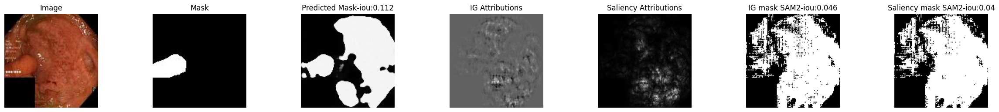

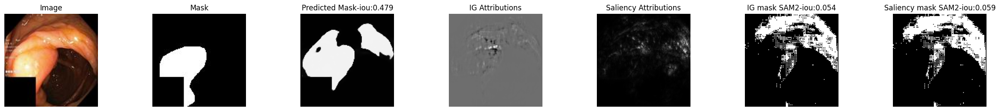

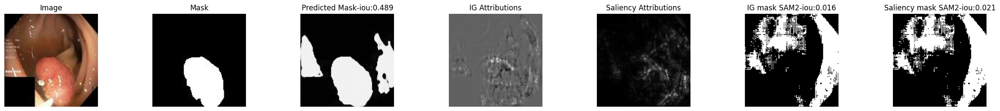

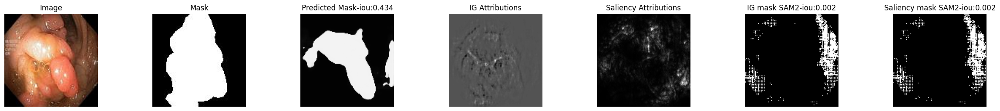

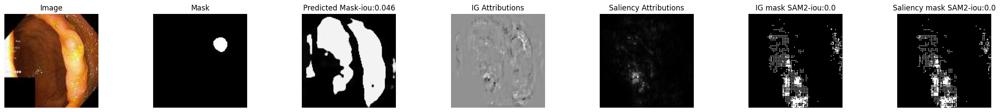

...

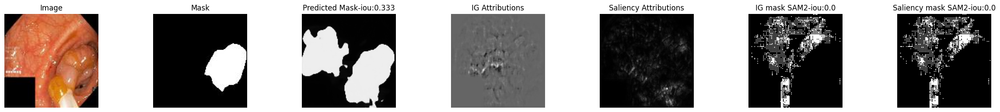

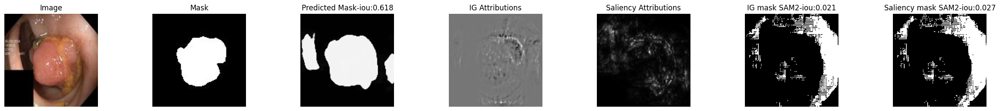

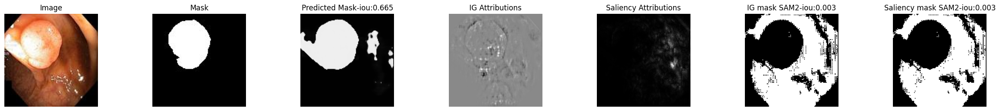

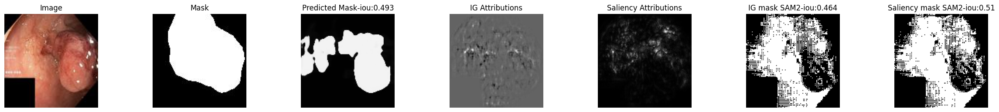

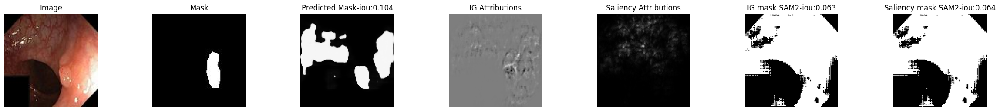

In [24]:
model.eval()
log_dict = {}
log_dict['iou_segmentator'] = []
log_dict['iou_ig'] = []
log_dict['iou_saliency'] = []
#log_dict['iou_dl'] = []
for i, (images, target_masks) in enumerate(test_loader):
    images = (images.permute(0, 3, 1, 2)/255).to(device)

    # Integrated Gradients
    ig = IntegratedGradients(model_wrap)
    attr_ig, delta_ig = ig.attribute(images, target=None, return_convergence_delta=True, internal_batch_size=1)
    attr_ig_norm = attr_ig[0].sum(dim=0).detach().cpu().numpy()
    attr_ig_norm = (attr_ig_norm - attr_ig_norm.min()) / (attr_ig_norm.max() - attr_ig_norm.min())


    # Saliency
    saliency = Saliency(model_wrap)
    attr_saliency = saliency.attribute(images, target=None)
    attr_saliency_norm = attr_saliency[0].sum(dim=0).detach().cpu().numpy()
    attr_saliency_norm = (attr_saliency_norm - attr_saliency_norm.min()) / (attr_saliency_norm.max() - attr_saliency_norm.min())

    ## DeepLift
    #dl = DeepLift(model_wrap)
    #attr_dl = dl.attribute(images, target=None)
    #attr_dl_norm = attr_dl[0].sum(dim=0).detach().cpu().numpy()
    #attr_dl_norm = (attr_dl_norm - attr_dl_norm.min()) / (attr_dl_norm.max() - attr_dl_norm.min())

    # Segmentator
    predicted_mask = model(images)
    iou_segmentator = compute_iou(predicted_mask[0][0].cpu().detach().numpy(), target_masks[0].cpu().detach().numpy())
    log_dict['iou_segmentator'].append(iou_segmentator)

    # SAM2
    images = images.permute(0, 2, 3, 1).cpu().detach().numpy()
    predictor.set_image(images[0])

    attr_ig_norm_sam_fixed = np.zeros((1, 256, 256))  # Initialize the new array
    attr_ig_norm_sam_fixed[0] = cv2.resize(attr_ig_norm, (256, 256), interpolation=cv2.INTER_LINEAR)
    masks_ig, _, _ = predictor.predict(mask_input= attr_ig_norm_sam_fixed)

    attr_saliency_norm_sam_fixed = np.zeros((1, 256, 256))  # Initialize the new array
    attr_saliency_norm_sam_fixed[0] = cv2.resize(attr_saliency_norm, (256, 256), interpolation=cv2.INTER_LINEAR)
    masks_saliency, _, _ = predictor.predict(mask_input=attr_saliency_norm_sam_fixed)
    #masks_dl, _, _ = predictor.predict(mask_input=attr_dl_norm)

    # calculate IOUs
    iou_ig = compute_iou(masks_ig[0], target_masks[0].cpu().detach().numpy())
    iou_saliency = compute_iou(masks_saliency[0], target_masks[0].cpu().detach().numpy())
    #iou_dl = compute_iou(masks_dl, target_masks[0].cpu().detach().numpy())
    log_dict['iou_ig'].append(iou_ig)
    log_dict['iou_saliency'].append(iou_saliency)
    #log_dict['iou_dl'].append(iou_dl)

    # plot original image, mask, predicted mask (model), attributions, predicted masks (SAM2)
    if i < 36:
        plt.figure(figsize=(30, 120))
        # origina image
        plt.subplot(36, 7, 1)
        plt.imshow(images[0])
        plt.title("Image")
        plt.axis("off")
        # target mask
        plt.subplot(36, 7, 2)
        plt.imshow(target_masks[0].cpu().detach().numpy(), cmap='gray')
        plt.title("Mask")
        plt.axis("off")
        # predicted mask segmentator
        plt.subplot(36, 7, 3)
        plt.imshow(predicted_mask[0][0].detach().cpu().numpy(), cmap='gray')
        plt.title(f"Predicted Mask-iou:{round(iou_segmentator,3)}")
        plt.axis("off")
        # ig atttribution
        plt.subplot(36, 7, 4)
        plt.imshow(attr_ig_norm, cmap='gray')
        plt.title("IG Attributions")
        plt.axis("off")
        # saliency atttribution
        plt.subplot(36, 7, 5)
        plt.imshow(attr_saliency_norm, cmap='gray')
        plt.title("Saliency Attributions")
        plt.axis("off")
        # predicted mask ig attribution
        plt.subplot(36, 7, 6)
        plt.imshow(masks_ig[0], cmap='gray')
        plt.title(f"IG mask SAM2-iou:{round(iou_ig,3)}")
        plt.axis("off")
        # predicted mask saliency attribution
        plt.subplot(36, 7, 7)
        plt.imshow(masks_saliency[0], cmap='gray')
        plt.title(f"Saliency mask SAM2-iou:{round(iou_saliency,3)}")
        plt.axis("off")
        plt.show()

In [25]:
# calculate the mean iou, std iou, max iou, min iou, median iou for each method
iou_segmentator_mean = np.mean(log_dict['iou_segmentator'])
iou_segmentator_std = np.std(log_dict['iou_segmentator'])
iou_segmentator_max = np.max(log_dict['iou_segmentator'])
iou_segmentator_min = np.min(log_dict['iou_segmentator'])
iou_segmentator_median = np.median(log_dict['iou_segmentator'])

iou_ig_mean = np.mean(log_dict['iou_ig'])
iou_ig_std = np.std(log_dict['iou_ig'])
iou_ig_max = np.max(log_dict['iou_ig'])
iou_ig_min = np.min(log_dict['iou_ig'])
iou_ig_median = np.median(log_dict['iou_ig'])

iou_saliency_mean = np.mean(log_dict['iou_saliency'])
iou_saliency_std = np.std(log_dict['iou_saliency'])
iou_saliency_max = np.max(log_dict['iou_saliency'])
iou_saliency_min = np.min(log_dict['iou_saliency'])
iou_saliency_median = np.median(log_dict['iou_saliency'])

# print the results
print(f"Segmentator: mean:{iou_segmentator_mean}, std:{iou_segmentator_std}, max:{iou_segmentator_max}, min:{iou_segmentator_min}, median:{iou_segmentator_median}")
print(f"IG: mean:{iou_ig_mean}, std:{iou_ig_std}, max:{iou_ig_max}, min:{iou_ig_min}, median:{iou_ig_median}")
print(f"Saliency: mean:{iou_saliency_mean}, std:{iou_saliency_std}, max:{iou_saliency_max}, min:{iou_saliency_min}, median:{iou_saliency_median}")

Segmentator: mean:0.37668032357404874, std:0.20942582856636152, max:0.8843471656811932, min:7.752661180461828e-05, median:0.37207029826928895
IG: mean:0.06849445214686052, std:0.09099090876435144, max:0.46410101273329835, min:0.0, median:0.03138215331518321
Saliency: mean:0.07044444773748575, std:0.09360445954639265, max:0.5101945881474789, min:0.0, median:0.03183291807284108


In [ ]:
# save all ious to a csv file using pandas
df = pd.DataFrame(log_dict)
df.to_csv('iou_results_interpretabilities.csv', index=False)
